In [17]:
%matplotlib inline
import matplotlib.pyplot as plt
import pickle
import numpy as np
import pandas
from keras import backend as K
import os
from IPython.display import Image
import csv

from sklearn.decomposition import PCA
import matplotlib.colors
from matplotlib.colors import LinearSegmentedColormap

from muon.dissolving.utils import get_cluster_centres
# from muon.dissolving.utils import pca_plot
# from muon.dissolving.redec import ReDEC
# from muon.dissolving.multitask import MultitaskDEC
# from muon.deep_clustering.clustering import Config
from muon.deep_clustering.clustering import discrete_cmap

import logging
logger = logging.getLogger()
logger.setLevel(logging.WARN)
# logger.ha

from muon.dissolving.decv2 import DECv2, Config


def report_run(save_dir, name):
    folder = save_dir.split('/')[-1]

    config = Config.load(save_dir+'/config.json')
    with open(config.splits_file, 'rb') as f:
        splits = pickle.load(f)
        x, y = splits['test']
    
    x_train, y_train = splits['train']
    x_train_dev, y_train_dev = splits['train_dev']
    x_test, y_test = splits['test']
    
    x = np.concatenate((x_train, x_train_dev))
    y = np.concatenate((y_train, y_train_dev))
    
    K.clear_session()
    dec = DECv2.load(save_dir, splits['train'][0], verbose=False)
    metrics = [name] + list(dec.calculate_metrics((x, y), (x_test, y_test)))

    pca_plot, pca = pca_plotv2(dec, x_train, y_train, config.n_clusters, title=name)
    
    cmap = list(zip(*dec.get_cluster_map(x_train, y_train)))
    cmap = pandas.DataFrame(cmap, columns=['majority class', 'n_assigned', 'purity'])
    
    pca_plot.savefig(pca_fig_fname(folder))
    with open(report_fname(folder), 'wb') as f:
        pickle.dump({'save_dir': save_dir, 'name': name, 'metrics': metrics, 'cmap': cmap}, f)

#     return {'folder', folder, 'metrics': metrics, 'cmap': cmap, 'pca_plot': pca_plot, 'pca': pca}
    return folder


,,f1,f1c,h,nmi
0,original dec,NaN,0.582431,0.534157,0.231778
1,norotation dec 10 clusters,NaN,0.256743,0.255469,0.136877
2,norotation multitask 10 clusters,0.0,0.745245,0.348965,0.301333
3,norotation redec 10 clusters,NaN,0.686281,0.289855,0.227810
4,norotation dec 10 clusters no y,NaN,0.225856,0.214220,0.115061
5,norotation multitask 10 clusters no y,0.0,0.809928,0.426471,0.439859
6,norotation redec 10 clusters no y,NaN,0.709789,0.376642,0.284044
7,norotation dec 50 clusters no y,NaN,0.741326,0.497359,0.205863
8,norotation multitask 50 clusters no y,0.0,0.800254,0.488044,0.384853
9,norotation redec 50 clusters no y,NaN,0.761847,0.424295,0.247146


original dec


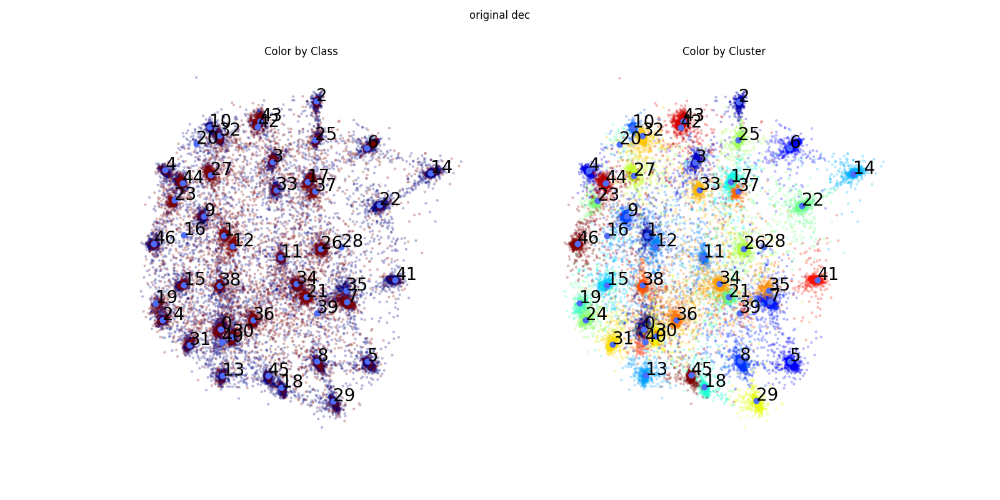

,majority class,n_assigned,purity
1,0,1356,0.786873
2,1,1470,0.676871
3,0,907,0.869901
4,0,1618,0.836836
5,0,1706,0.935522
6,0,1588,0.933249
7,0,1459,0.868403
8,0,2289,0.745740
9,0,1599,0.870544
10,0,697,0.816356


norotation dec 10 clusters


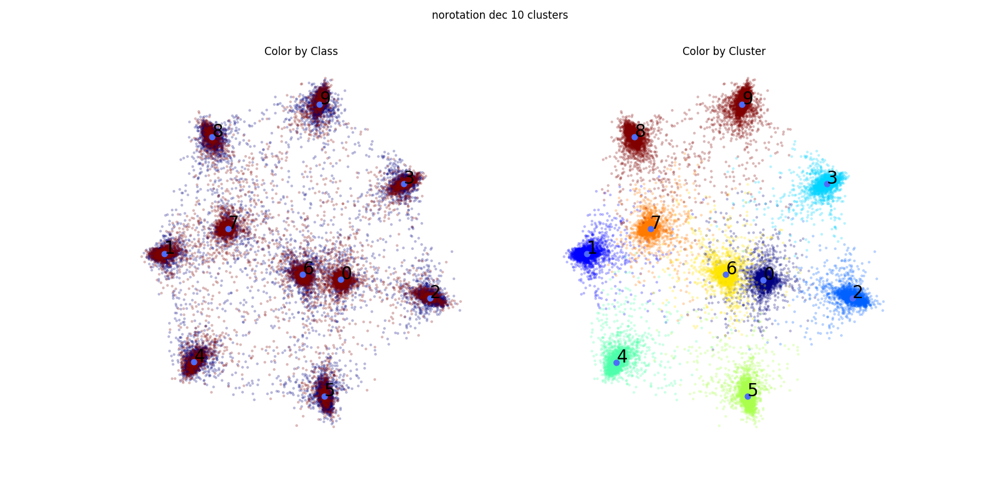

,majority class,n_assigned,purity
0,1,4795,0.604380
1,0,6079,0.815430
2,0,4832,0.860513
3,0,5323,0.789217
4,0,5662,0.864006
5,0,5501,0.883112
6,0,6017,0.692538
7,0,4208,0.543726
8,0,5669,0.856588
9,0,5097,0.867177


norotation multitask 10 clusters


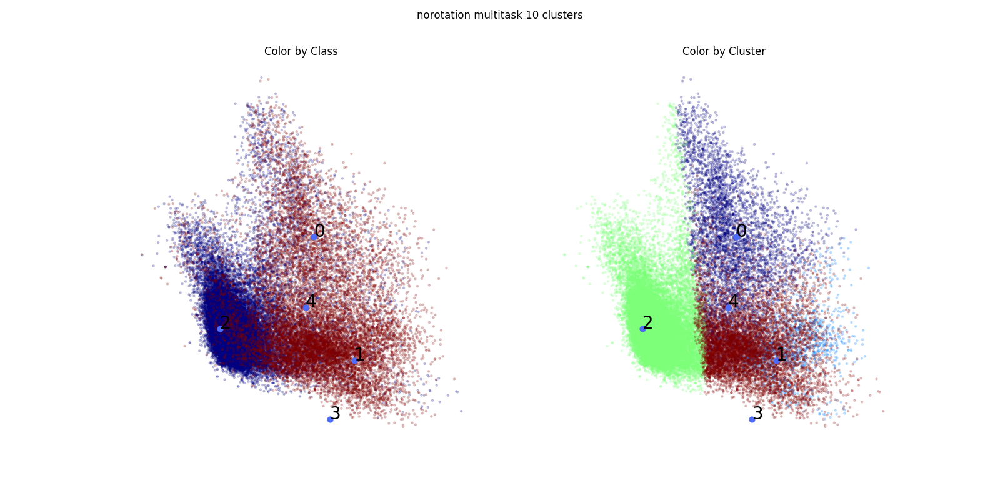

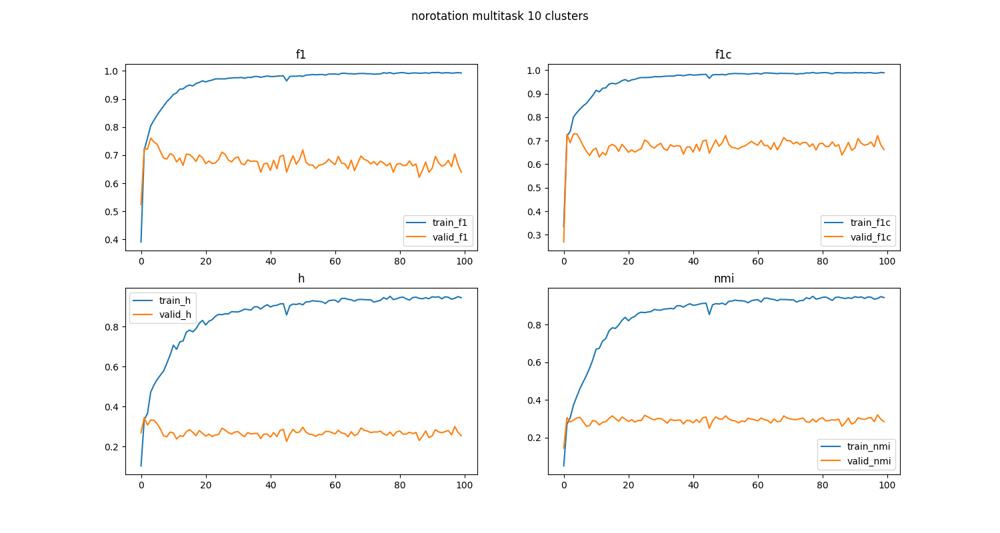

,majority class,n_assigned,purity
0,1,5159,0.712929
3,1,1177,0.858114
4,0,39720,0.947054
6,1,5041,0.842293
7,1,2086,0.696069


norotation redec 10 clusters


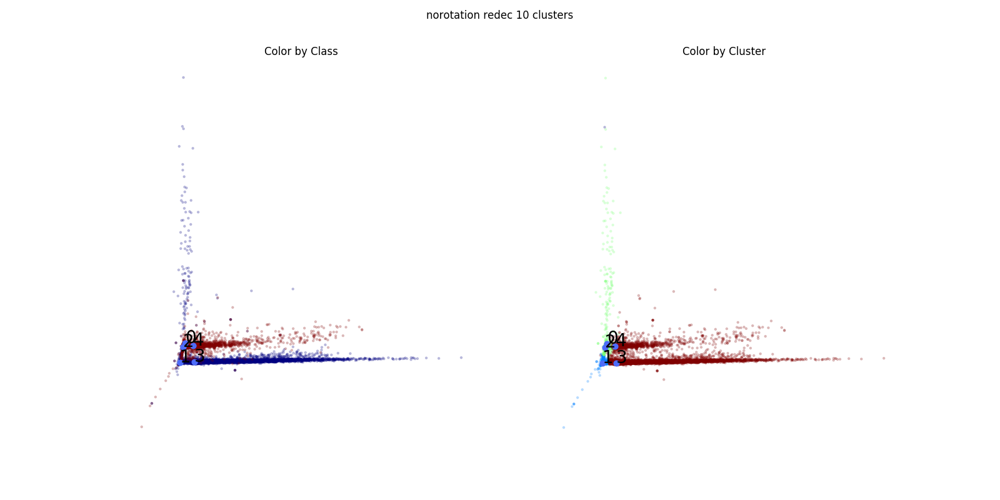

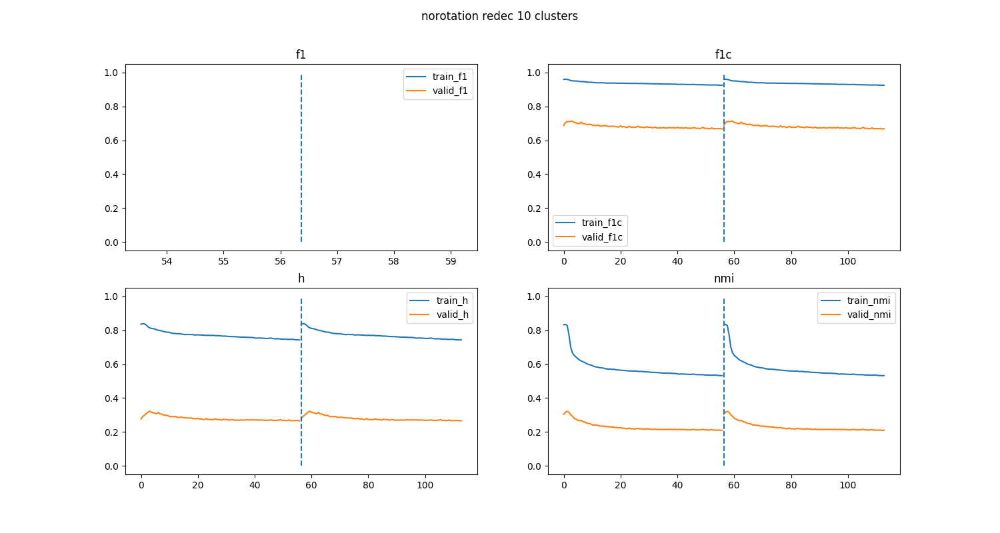

,majority class,n_assigned,purity
2,0,1,1.000000
4,0,25631,0.997932
6,1,11584,0.981699
7,0,15809,0.941995
9,1,158,0.930380


norotation dec 10 clusters no y


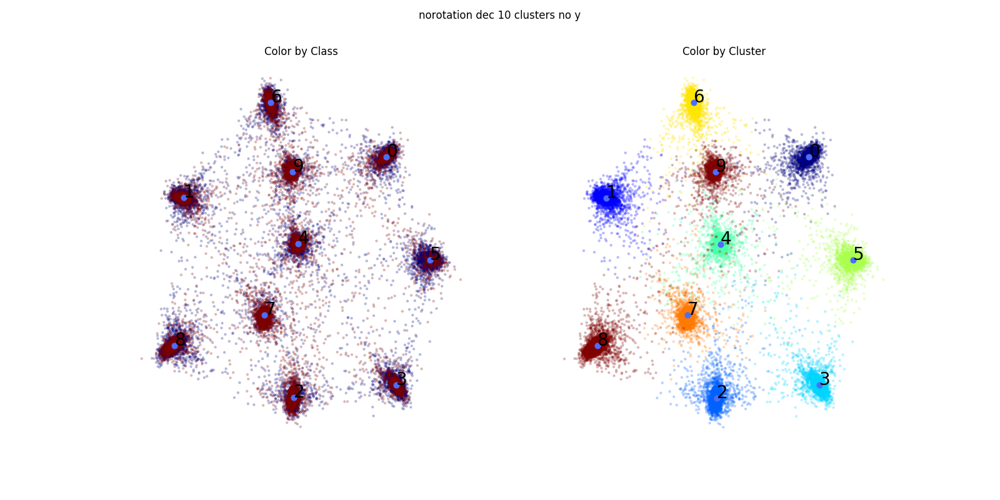

,majority class,n_assigned,purity
0,0,5571,0.838629
1,0,6405,0.864949
2,0,5442,0.710033
3,0,4865,0.823433
4,0,4709,0.736462
5,0,5237,0.911782
6,0,6285,0.834686
7,1,4078,0.643943
8,0,6586,0.826602
9,0,4005,0.556055


norotation multitask 10 clusters no y


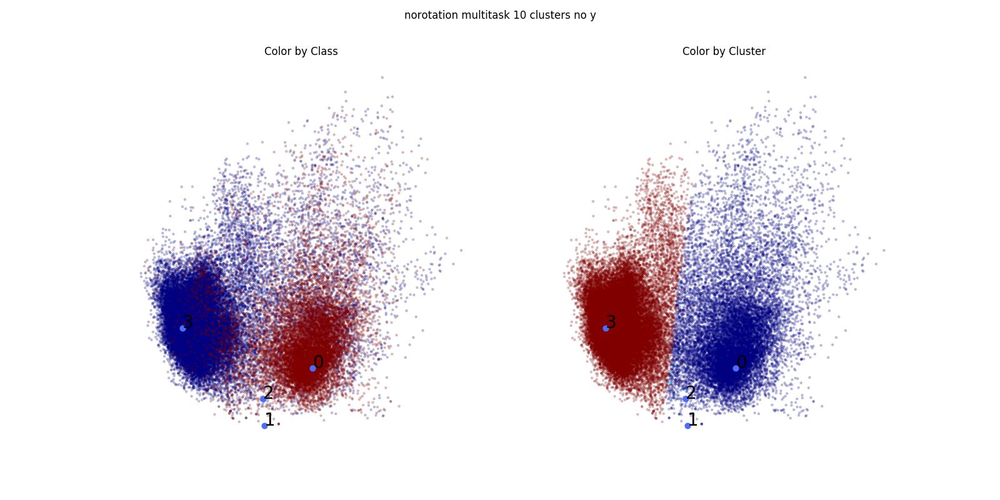

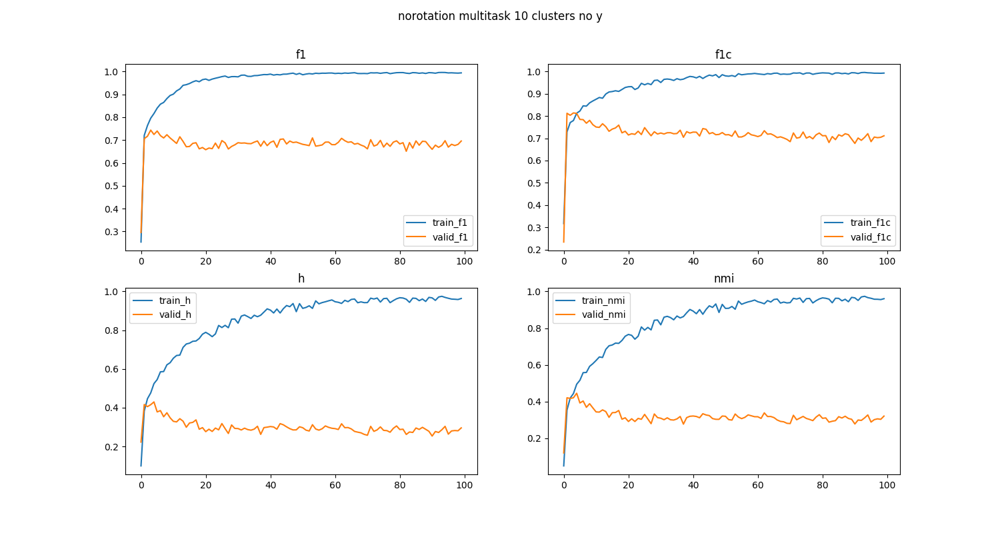

,majority class,n_assigned,purity
2,1,15851,0.726579
7,0,10,0.800000
8,0,15,0.600000
9,0,37307,0.974160


norotation redec 10 clusters no y


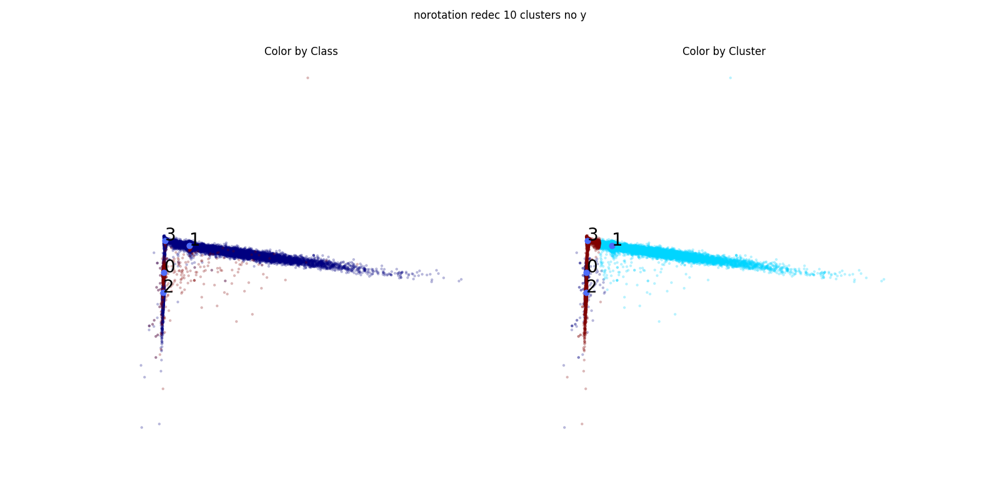

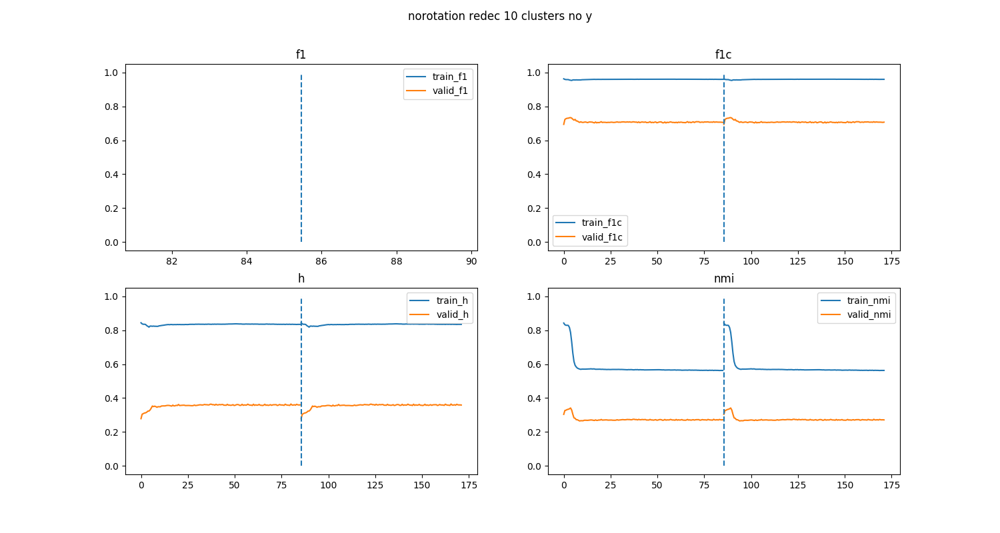

,majority class,n_assigned,purity
2,1,12408,0.992182
6,0,14904,0.990942
8,0,2501,0.991603
9,0,23370,0.999059


norotation dec 50 clusters no y


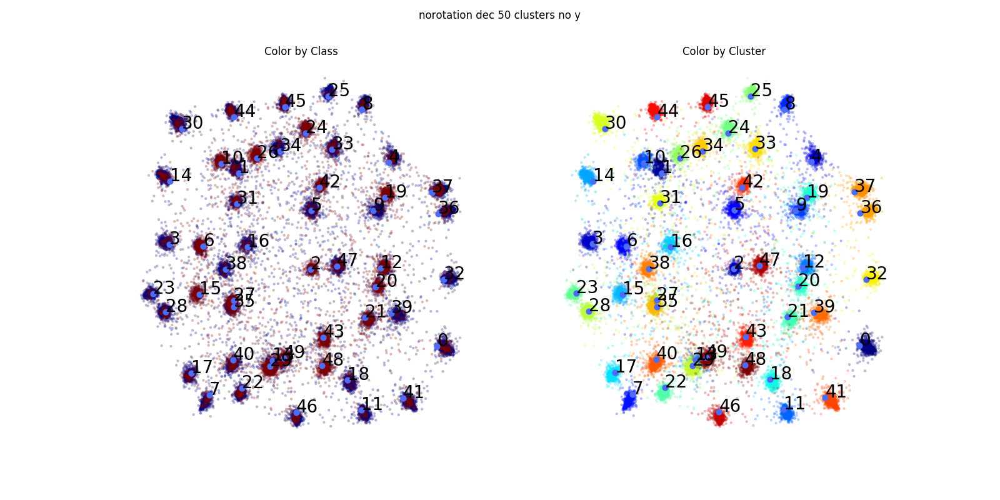

,majority class,n_assigned,purity
0,0,1583,0.906507
1,0,903,0.873754
2,1,812,0.610837
3,0,1359,0.938926
4,0,1293,0.880124
5,0,1008,0.878968
6,1,993,0.568983
7,0,1614,0.949195
8,0,1277,0.933438
9,0,778,0.931877


norotation multitask 50 clusters no y


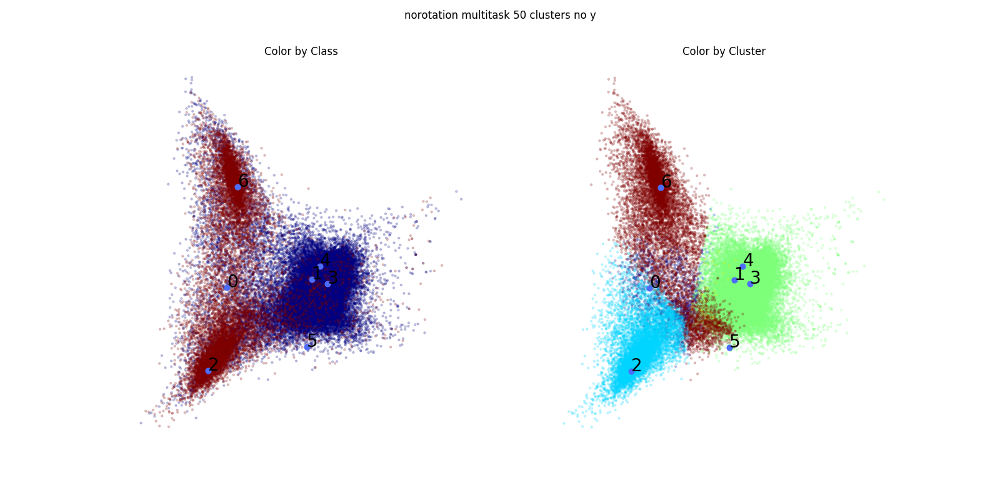

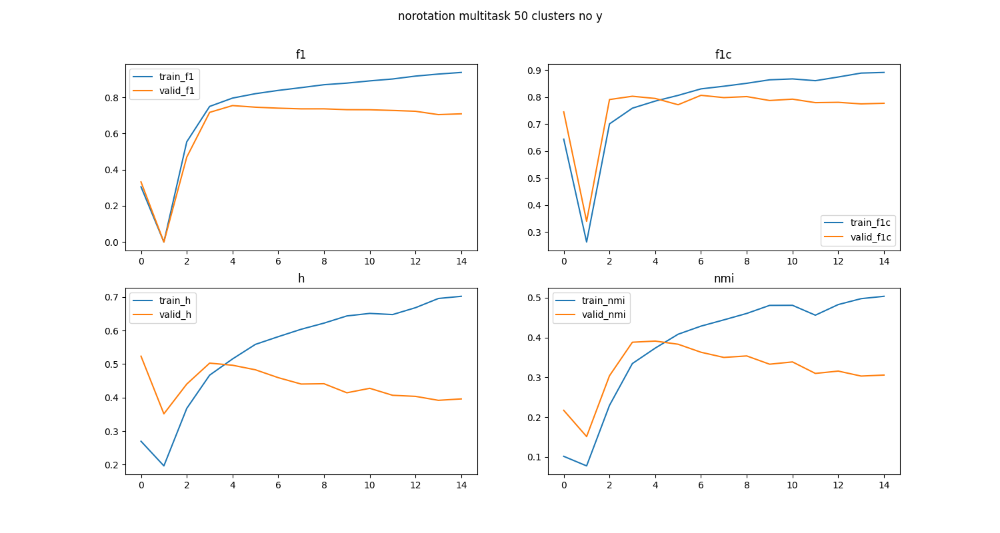

,majority class,n_assigned,purity
2,0,1433,0.520586
7,0,198,0.873737
12,1,7841,0.752710
17,0,35151,0.980342
28,0,89,0.831461
40,0,1087,0.827967
43,1,7384,0.674702


norotation redec 50 clusters no y


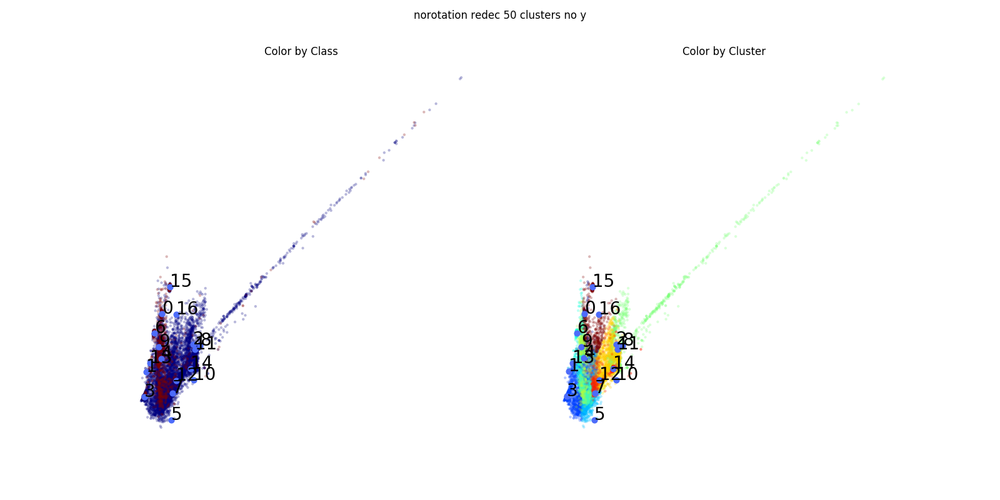

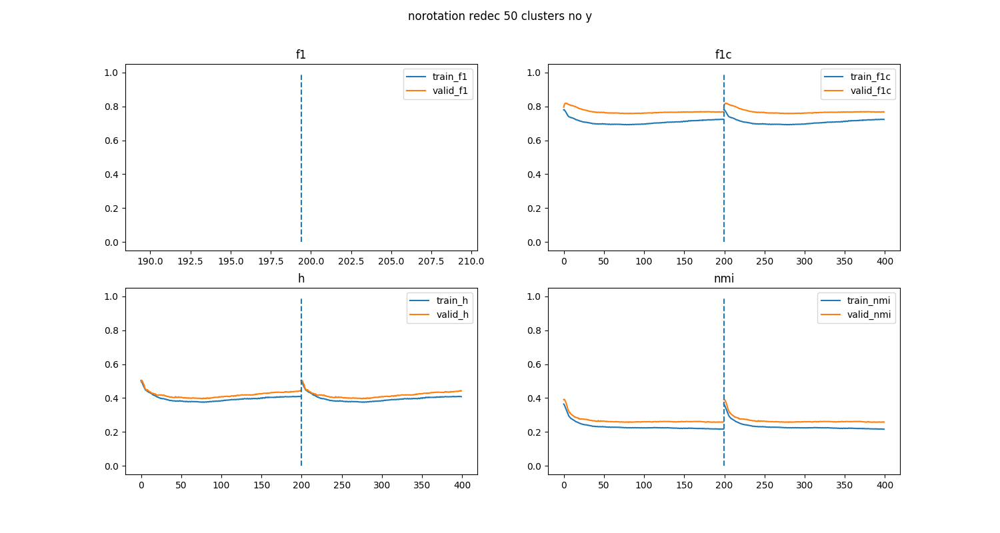

,majority class,n_assigned,purity
2,0,4521,0.755806
4,0,5,0.600000
7,0,1,1.000000
8,0,4455,0.943883
9,0,375,0.928000
10,0,1020,0.966667
12,1,8605,0.663568
13,0,460,0.858696
17,0,16477,0.991867
21,0,429,0.855478


rotation dec 50 clusters


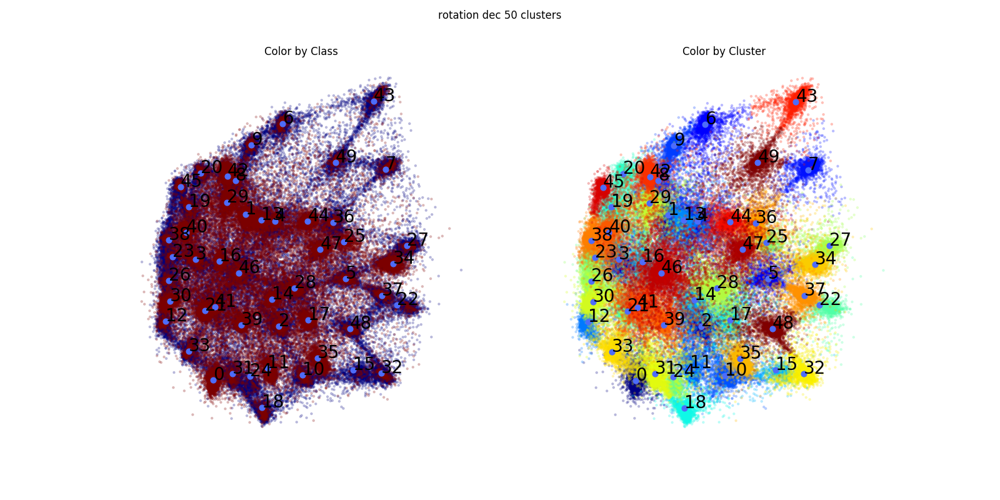

,majority class,n_assigned,purity
0,1,4195,0.722527
1,1,5402,0.708441
2,0,9802,0.877780
3,0,10659,0.847641
4,0,11342,0.865985
5,0,9849,0.905270
6,0,9568,0.927153
7,0,6337,0.906423
8,0,9711,0.910823
9,0,5950,0.909076


rotation multitask 50 clusters


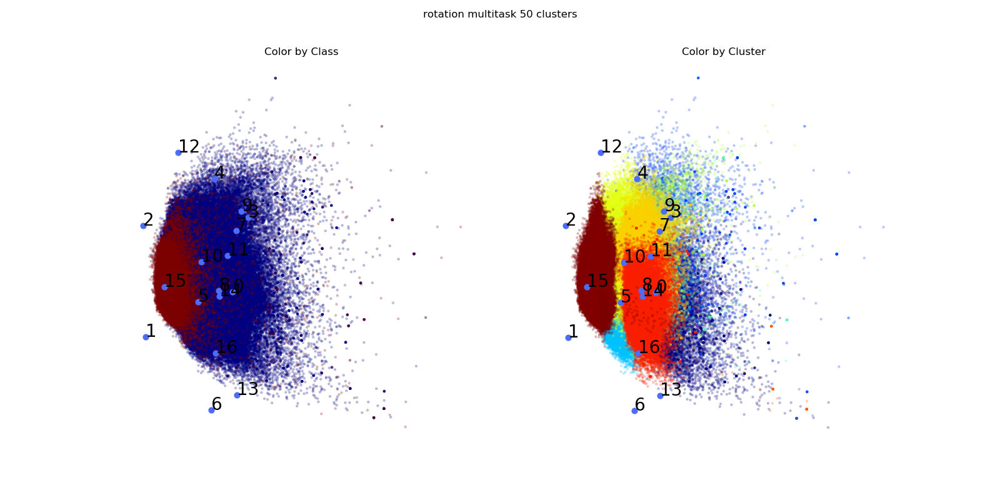

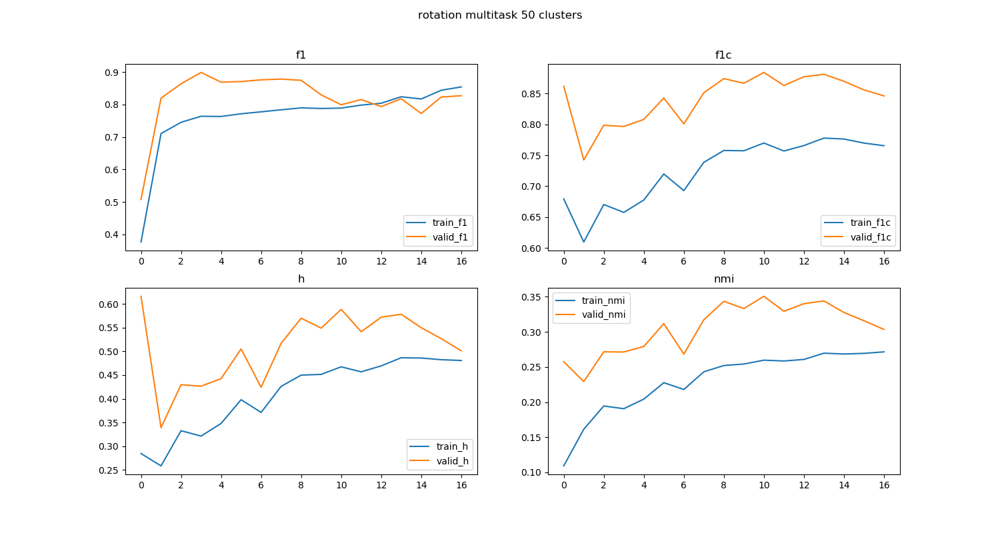

,majority class,n_assigned,purity
7,0,29581,0.989284
13,0,2,0.500000
14,0,2,1.000000
15,0,3388,0.961334
18,0,132,0.969697
19,0,84608,0.982709
20,0,1,1.000000
22,0,1272,0.970126
23,0,20691,0.995409
24,0,1136,0.963028


norotation multitask 10 clusters no y v2


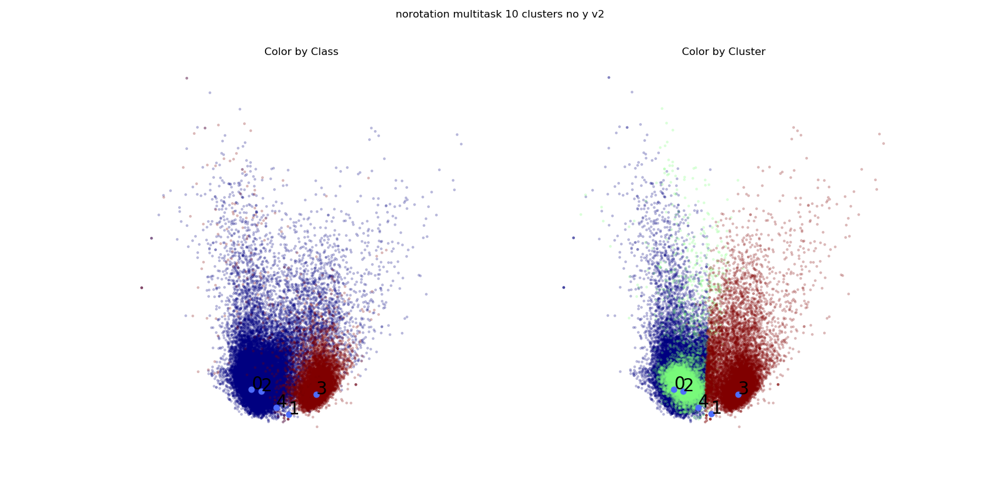

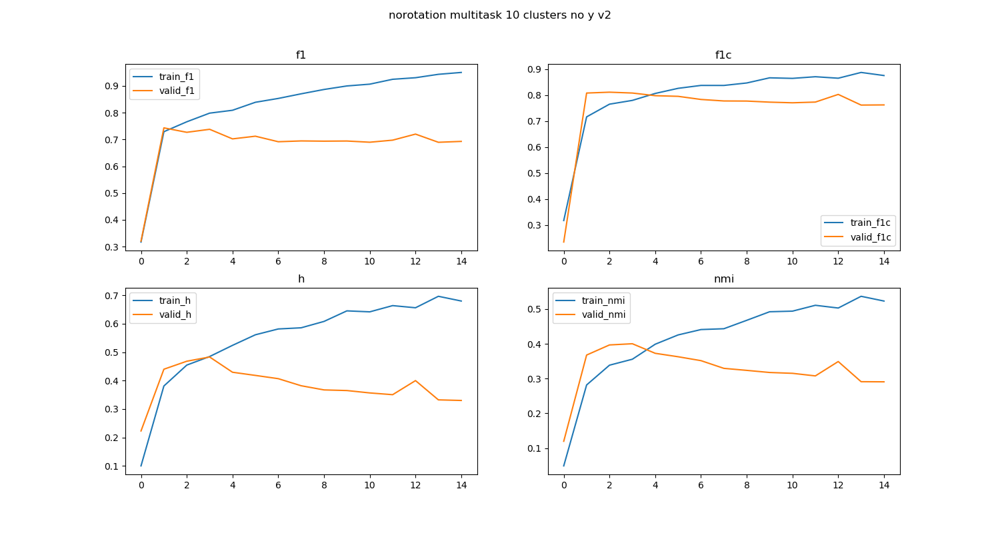

,majority class,n_assigned,purity
0,0,31508,0.994192
2,0,5,0.600000
5,0,6086,0.996878
8,1,15576,0.788713
9,0,8,1.000000


norotation redec 10 clusters no y v2


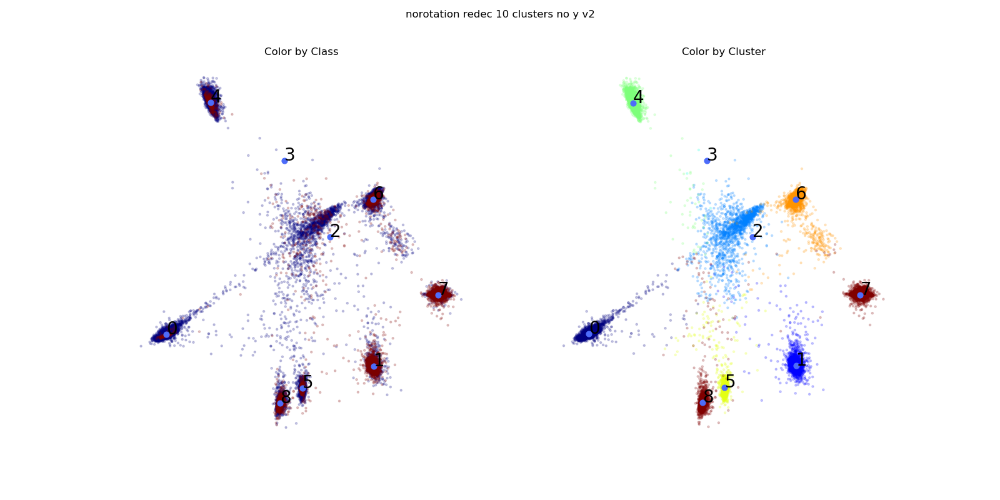

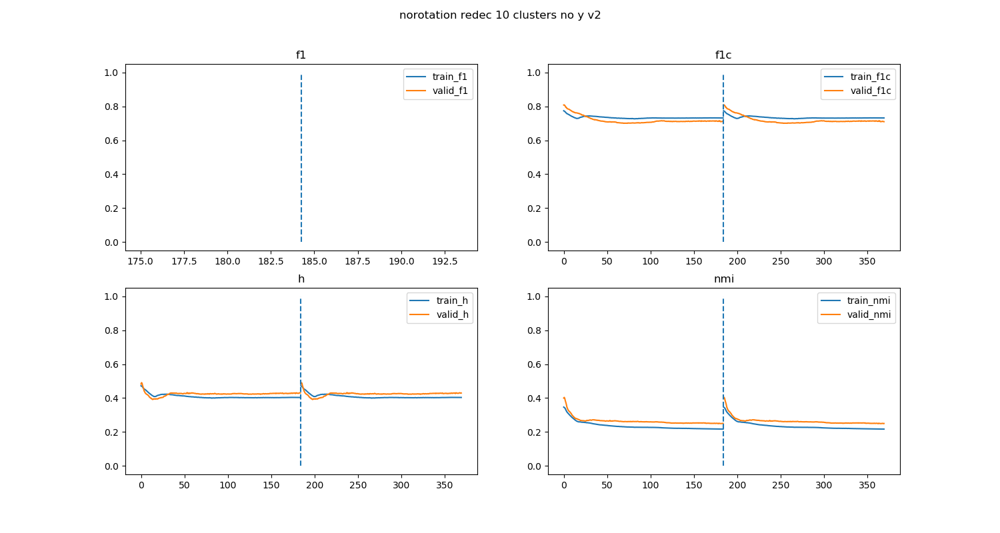

,majority class,n_assigned,purity
0,0,15023,0.989749
1,1,2260,0.638496
2,0,1581,0.864643
3,0,3,0.666667
5,0,7625,0.950820
6,0,4119,0.924496
7,0,6110,0.861211
8,1,10577,0.745202
9,0,5885,0.785726


norotation redec 50 clusters no y v2


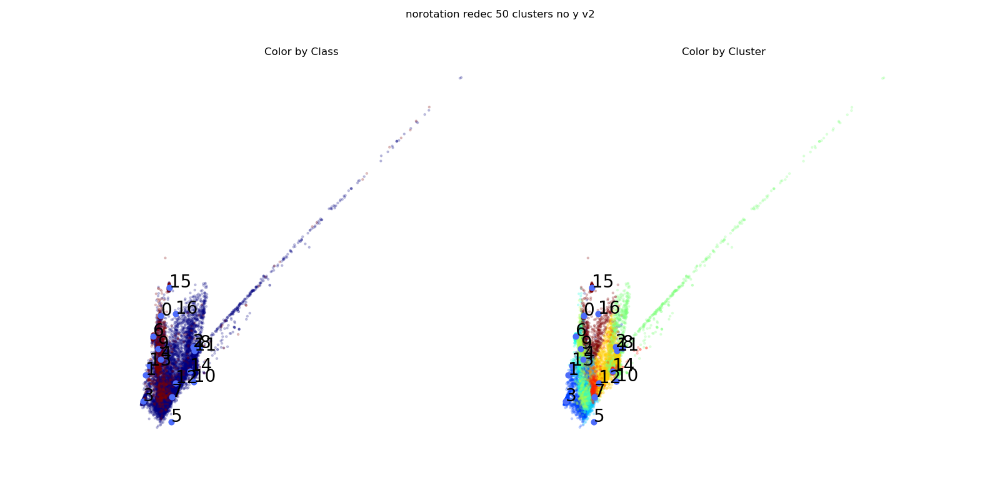

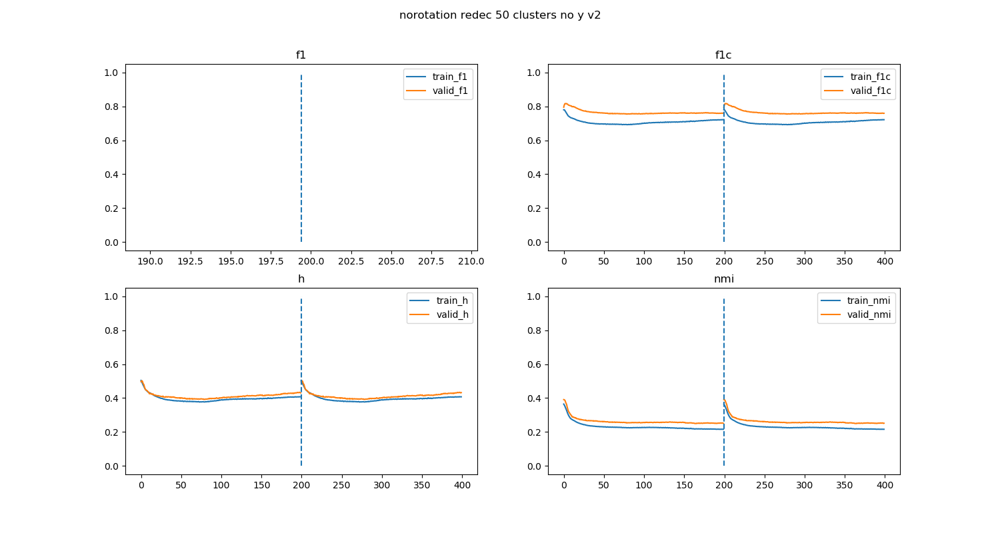

,majority class,n_assigned,purity
2,0,5021,0.768970
4,0,4,0.500000
7,0,21,0.952381
8,0,4678,0.946345
9,0,189,0.952381
10,0,641,0.971919
12,1,8489,0.666745
13,0,583,0.852487
17,0,16333,0.992347
21,0,538,0.830855


norotation dec 50 clusters no y v2-1


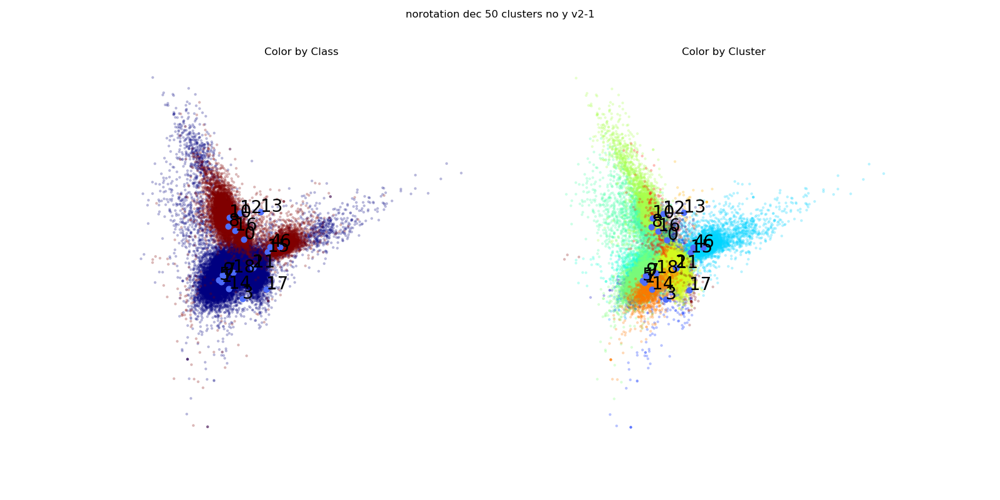

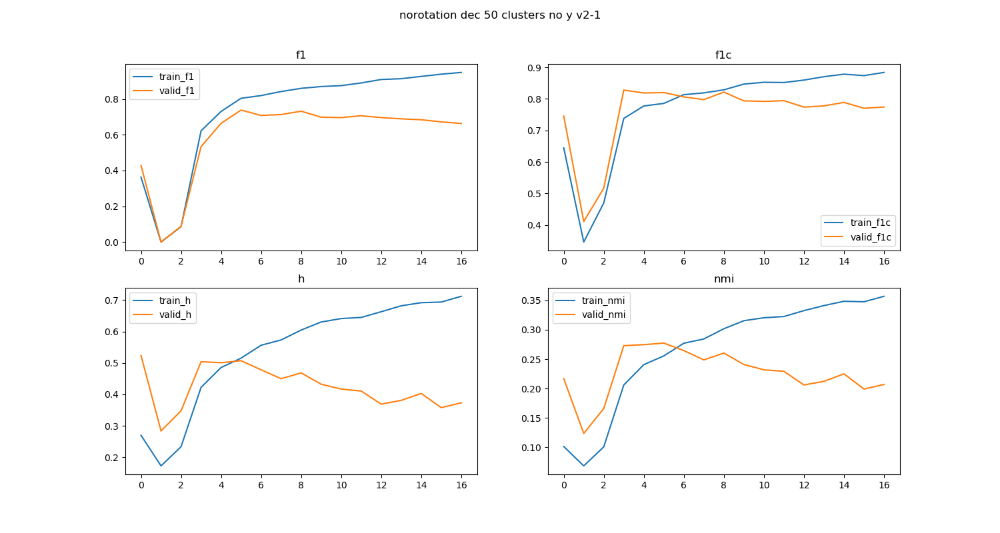

,majority class,n_assigned,purity
2,1,1332,0.712462
7,0,1718,0.994761
9,0,8826,0.997394
10,0,178,0.932584
12,0,14,0.714286
17,0,114,0.956140
19,1,4941,0.808946
22,0,8566,0.997899
27,1,4045,0.720643
28,0,6082,0.993259


[['original dec',
  nan,
  0.5824308062575211,
  0.5341566120372322,
  0.23177777723603904],
 ['norotation dec 10 clusters',
  nan,
  0.25674325674325676,
  0.2554692764803343,
  0.13687723696157716],
 ['norotation multitask 10 clusters',
  0.0,
  0.7452445652173914,
  0.3489646881476385,
  0.3013333462114212],
 ['norotation redec 10 clusters',
  nan,
  0.6862814604750089,
  0.28985509961668476,
  0.22780991064337464],
 ['norotation dec 10 clusters no y',
  nan,
  0.22585590189064894,
  0.21422014120231556,
  0.11506134189871044],
 ['norotation multitask 10 clusters no y',
  0.0,
  0.8099277411247251,
  0.42647137283236763,
  0.4398589932752984],
 ['norotation redec 10 clusters no y',
  nan,
  0.7097890003459011,
  0.3766418715612607,
  0.28404438395185355],
 ['norotation dec 50 clusters no y',
  nan,
  0.7413260048093437,
  0.4973589731335231,
  0.2058630800788991],
 ['norotation multitask 50 clusters no y',
  0.0,
  0.8002544529262087,
  0.4880442548776453,
  0.38485294835237877],
 [

In [36]:
%matplotlib inline
with open(os.path.join(os.getenv('MUON'), 'muon/scripts/models/decv2/models.csv')) as f:
    reader = csv.reader(f)
    next(reader)
    runs = [i[0].strip() for i in reader if int(i[2])]
# runs = [('mnt/clustering_models/original_dec', 'original dec'),
#         ('mnt/clustering_models/aws/decv2/norotation/dec_1-2018-12-09T03:56:15', 'norotation dec 50 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/multitask_1-2018-12-09T06:54:30', 'norotation multitask 50 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/redec_1-2018-12-09T08:13:14', 'norotation redec 50 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/dec_2-2018-12-09T06:25:30', 'norotation dec 10 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/multitask_1-2018-12-09T10:38:26', 'norotation multitask 10 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/redec_1-2018-12-09T17:20:11/', 'norotation redec 10 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/dec_1-2018-12-09T08:29:41', 'norotation dec 10 clusters no y'),
#         ('mnt/clustering_models/aws/decv2/norotation/multitask_1-2018-12-09T09:52:20', 'norotation multitask 10 clusters no y'),
#         ('mnt/clustering_models/aws/decv2/norotation/redec_1-2018-12-09T17:17:21', 'norotation redec 10 clusters no y'),
#         ('mnt/clustering_models/aws/decv2/norotation/multitask_1-2018-12-09T21:54:47/', 'norotation multitask 50 clusters no y'),
#         ('mnt/clustering_models/aws/decv2/norotation/redec_1-2018-12-09T22:21:22', 'norotation redec 50 clusters no y'),
#         ('mnt/clustering_models/aws/decv2/rotation/dec_1-2018-12-09T18:36:16', 'rotation dec 50 clusters'),
#         ('mnt/clustering_models/aws/decv2/rotation/multitask_1-2018-12-09T22:36:29/', 'rotation multitask 50 clusters'),
#         ('mnt/clustering_models/aws/decv2/norotation/multitask_1-2018-12-09T23:42:14', 'norotation multitask 10 clusters no y v2')]

def report_runs(runs):
    metrics = []
    for save_dir in runs:
    #     display(Image(save_dir+'/pca_plot.png'))
        with open(save_dir+'/report.pkl', 'rb') as f:
            item = pickle.load(f)
        metrics.append([item['name'], *item['metrics']])
    display(pandas.DataFrame(metrics, columns=['', 'f1', 'f1c', 'h', 'nmi']))


    for save_dir in runs:
        with open(save_dir+'/report.pkl', 'rb') as f:
            item = pickle.load(f)
            print(item['name'])
        display(Image(save_dir+'/pca_plot.png'))
        if os.path.isfile(save_dir+'/metrics.pkl'):
            display(Image(save_dir+'/train_metrics.png'))

        cmap = list(zip(*item['cmap']))
        cmap = pandas.DataFrame(cmap, columns=['majority class', 'n_assigned', 'purity'])
        display(cmap.loc[cmap['n_assigned']>0])
        
    return metrics

report_runs(runs)
    

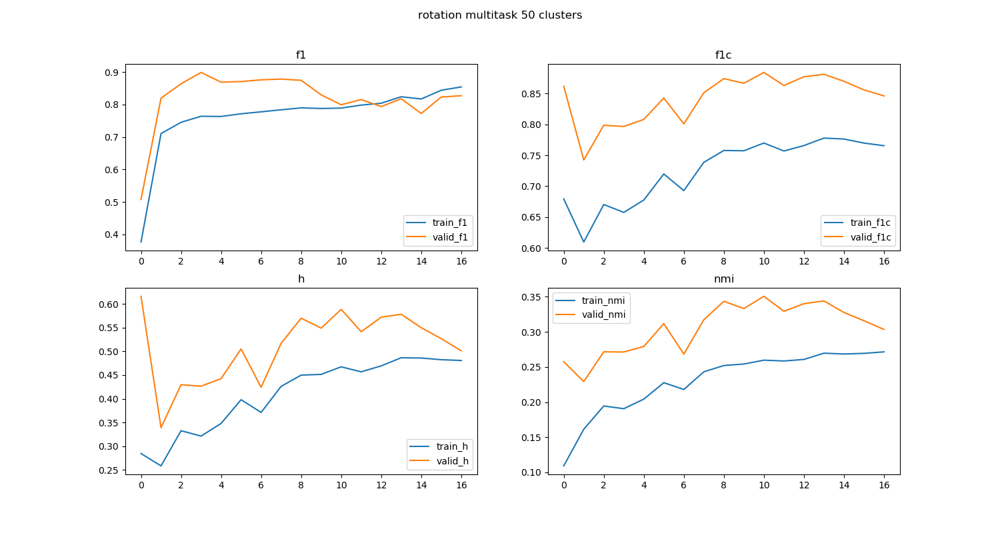

In [14]:
runs = [('mnt/clustering_models/aws/decv2/rotation/multitask_1-2018-12-09T22:36:29/', 'rotation multitask 50 clusters'),]
display(Image(filename=runs[0][0]+'train_metrics.png'))

This one is really strange. The validation metrics are significantly higher than the tranining metrics

validation data is a subset of the training data.

The rotation is doing something that makes the model hard to fit.